Analyze the Dataset

In [2]:
import pandas as pd
import numpy as np
import time
from sklearn.metrics.pairwise import cosine_similarity
import regex as re

ModuleNotFoundError: No module named 'regex'

# Load Data

In [15]:
df = pd.read_csv("emails.csv")

def extract_field(text, field):
    if pd.isna(text):
        return None
    pattern = rf"{field}:\s*(.*)"
    match = re.search(pattern, text)
    return match.group(1).strip() if match else None

def extract_body(text):
    if pd.isna(text):
        return None
    parts = text.split("\n\n", 1)
    return parts[1].strip() if len(parts) > 1 else None


# Apply extraction to EACH ROW
df = pd.DataFrame({
    "messageID": df["message"].apply(lambda x: extract_field(x, "Message-ID")),
    "date": df["message"].apply(lambda x: extract_field(x, "Date")),
    "from": df["message"].apply(lambda x: extract_field(x, "From")),
    "to": df["message"].apply(lambda x: extract_field(x, "To")),
    "subject": df["message"].apply(lambda x: extract_field(x, "Subject")),
    "folder": df["message"].apply(lambda x: extract_field(x, "X-Folder")),
    "body": df["message"].apply(extract_body)
})

print(df.head(2))

                                       messageID  \
0  <18782981.1075855378110.JavaMail.evans@thyme>   
1  <15464986.1075855378456.JavaMail.evans@thyme>   

                                    date                     from  \
0  Mon, 14 May 2001 16:39:00 -0700 (PDT)  phillip.allen@enron.com   
1   Fri, 4 May 2001 13:51:00 -0700 (PDT)  phillip.allen@enron.com   

                        to            subject  \
0     tim.belden@enron.com  Mime-Version: 1.0   
1  john.lavorato@enron.com                Re:   

                                              folder  \
0  \Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...   
1  \Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...   

                                                body  
0                               Here is our forecast  
1  Traveling to have a business meeting takes the...  


Extract Date components for EDA

In [16]:
df['datetime'] = pd.to_datetime(df['date'], errors='coerce', utc=True)
df['date_clean'] = df['datetime'].dt.strftime('%Y-%m-%d %H:%M:%S')

df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['day'] = df['datetime'].dt.day
df['hour'] = df['datetime'].dt.hour
df['minute'] = df['datetime'].dt.minute
df['weekday'] = df['datetime'].dt.weekday      # 0=Mon
df['weekday_name'] = df['datetime'].dt.day_name()
df['is_weekend'] = df['weekday'].isin([5,6]).astype(int)




C:\Users\cicily.mathew\AppData\Local\Temp\ipykernel_59344\1163004386.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['datetime'] = pd.to_datetime(df['date'], errors='coerce', utc=True)


In [17]:
df.head()

,messageID,date,from,to,subject,folder,body,datetime,date_clean,year,month,day,hour,minute,weekday,weekday_name,is_weekend
0,<18782981.1075855378110.JavaMail.evans@thyme>,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",phillip.allen@enron.com,tim.belden@enron.com,Mime-Version: 1.0,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Here is our forecast,2001-05-14 23:39:00+00:00,2001-05-14 23:39:00,2001,5,14,23,39,0,Monday,0
1,<15464986.1075855378456.JavaMail.evans@thyme>,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Traveling to have a business meeting takes the...,2001-05-04 20:51:00+00:00,2001-05-04 20:51:00,2001,5,4,20,51,4,Friday,0
2,<24216240.1075855687451.JavaMail.evans@thyme>,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",phillip.allen@enron.com,leah.arsdall@enron.com,Re: test,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,test successful. way to go!!!,2000-10-18 10:00:00+00:00,2000-10-18 10:00:00,2000,10,18,10,0,2,Wednesday,0
3,<13505866.1075863688222.JavaMail.evans@thyme>,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,Mime-Version: 1.0,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,"Randy,\n\n Can you send me a schedule of the s...",2000-10-23 13:13:00+00:00,2000-10-23 13:13:00,2000,10,23,13,13,0,Monday,0
4,<30922949.1075863688243.JavaMail.evans@thyme>,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Let's shoot for Tuesday at 11:45.,2000-08-31 12:07:00+00:00,2000-08-31 12:07:00,2000,8,31,12,7,3,Thursday,0


In [35]:
df['body_length'] = df['body'].str.len()
df['subject_length'] = df['subject'].str.len()


# Univariate analaysis of features

In [18]:
# nulls in the dataset
print(df.isnull().sum())


messageID       0
date            0
from            0
to              0
subject         0
folder          0
body            0
datetime        0
date_clean      0
year            0
month           0
day             0
hour            0
minute          0
weekday         0
weekday_name    0
is_weekend      0
dtype: int64


In [19]:
# Distribution of to field
to_distribution = df['to'].value_counts()
print(to_distribution.head(10))

to
pete.davis@enron.com         9155
X-cc:                        8655
tana.jones@enron.com         5677
sara.shackleton@enron.com    4974
vkaminski@aol.com            4870
jeff.dasovich@enron.com      4350
kate.symes@enron.com         3517
all.worldwide@enron.com      3324
mark.taylor@enron.com        3295
kay.mann@enron.com           3085
Name: count, dtype: int64


In [20]:
# distribution of from field
from_distribution = df['from'].value_counts()
print(from_distribution.head(10))

from
kay.mann@enron.com               16735
vince.kaminski@enron.com         14368
jeff.dasovich@enron.com          11411
pete.davis@enron.com              9149
chris.germany@enron.com           8801
sara.shackleton@enron.com         8777
enron.announcements@enron.com     8587
tana.jones@enron.com              8490
steven.kean@enron.com             6759
kate.symes@enron.com              5438
Name: count, dtype: int64


In [22]:
# distribution of date fields
date_distribution = df['date_clean'].value_counts()
print(date_distribution.head(10))
time_distribution = df['hour'].value_counts()
print(time_distribution.head(10))

date_clean
2001-06-27 23:02:00    1118
2001-06-26 22:32:00     652
1980-01-01 00:00:00     522
2000-12-13 14:34:00     110
2001-10-25 02:22:28     104
2000-12-13 06:01:00     101
2001-11-19 21:34:59      98
2001-10-26 23:11:01      96
2001-10-26 04:43:45      96
2001-11-21 16:16:53      94
Name: count, dtype: int64
hour
16    45061
15    44081
14    41516
17    38279
10    35454
13    35405
9     32809
11    32549
18    27720
12    26327
Name: count, dtype: int64


In [27]:
# monthly distribution  
monthly_distribution = df['month'].value_counts()
print(monthly_distribution.head(12))


month
10    63286
11    62520
1     52122
5     47511
12    46416
4     45688
3     40863
2     38701
6     34094
9     32102
8     29117
7     24981
Name: count, dtype: int64


In [28]:
# is weekend distribution
weekend_distribution = df['is_weekend'].value_counts()
print(weekend_distribution)


is_weekend
0    497820
1     19581
Name: count, dtype: int64


In [23]:
day_of_week_distribution = df['weekday_name'].value_counts()
print(day_of_week_distribution)

weekday_name
Wednesday    107223
Tuesday      106515
Monday        97276
Thursday      96621
Friday        90185
Sunday        10581
Saturday       9000
Name: count, dtype: int64


In [24]:
# Subject length distribution
df['subject_length'] = df['subject'].apply(lambda x: len(x) if pd.notnull(x) else 0)
subject_length_distribution = df['subject_length'].value_counts()
print(subject_length_distribution.head(10))

subject_length
17    30723
3     16465
16    14481
24    14027
18    13997
20    13398
19    13121
21    12833
22    12740
15    12629
Name: count, dtype: int64


In [29]:
# Body length distribution
df['body_length'] = df['body'].apply(lambda x: len(x) if pd.notnull(x) else 0)
body_length_distribution = df['body_length'].value_counts()
print(body_length_distribution.head(10))
print(body_length_distribution.tail(10))

body_length
214    1494
215    1307
213    1171
50      912
108     826
106     816
48      800
107     792
212     685
33      672
Name: count, dtype: int64
body_length
6475     1
27080    1
8752     1
8382     1
12048    1
8803     1
23474    1
15285    1
8231     1
11591    1
Name: count, dtype: int64


In [30]:
# is replied distribution
df['is_replied'] = df['subject'].apply(lambda x: 1 if pd.notnull(x) and x.startswith("Re:") else 0)
is_replied_distribution = df['is_replied'].value_counts()
print(is_replied_distribution)

is_replied
0    413946
1    103455
Name: count, dtype: int64


In [32]:
# is frwd distribution
df['is_frwd'] = df['subject'].apply(lambda x: 1 if pd.notnull(x) and x.startswith("Fwd:") else 0)
is_frwd_distribution = df['is_frwd'].value_counts()
print(is_frwd_distribution)

is_frwd
0    513681
1      3720
Name: count, dtype: int64


In [33]:
# is question distribution
df['is_question'] = df['subject'].apply(lambda x: 1 if pd.notnull(x) and x.endswith("?") else 0)
is_question_distribution = df['is_question'].value_counts()
print(is_question_distribution)

is_question
0    511709
1      5692
Name: count, dtype: int64


In [12]:
# Drop rows corresponding to folder locations that have less than 5 emails corresponding
counts=df['folder'].value_counts()
valid_classes=counts[counts>=5].index
#f=df[df['folder'].isin(valid_classes)].copy()

print (len(valid_classes))

#Rows of data that does not belong to them
df = df[df['folder'].isin(valid_classes)]
df.shape

1945


(96383, 22)

# Analyze Data with Folder Variable

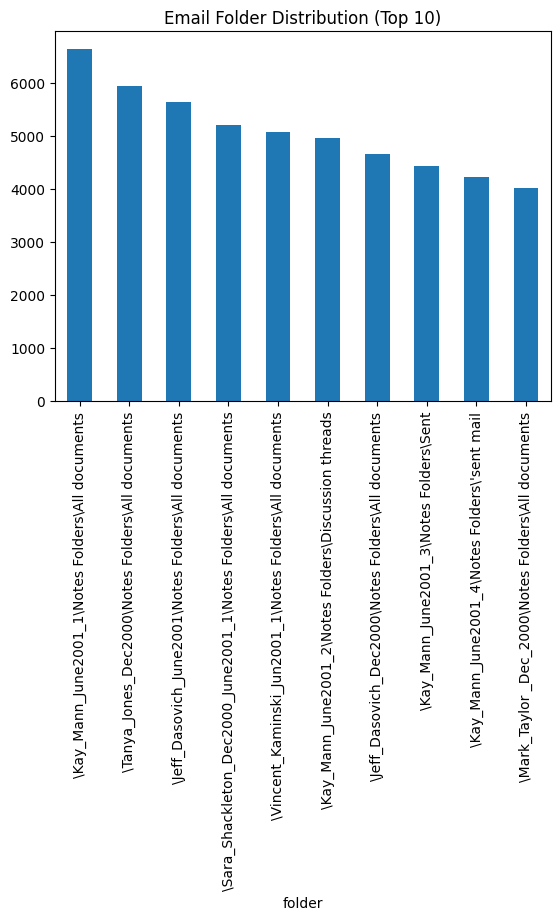

In [39]:
import matplotlib.pyplot as plt

df['folder'].value_counts().head(10).plot(kind='bar')
plt.title('Email Folder Distribution (Top 10)')
plt.show()


## Build word clouds based on email body

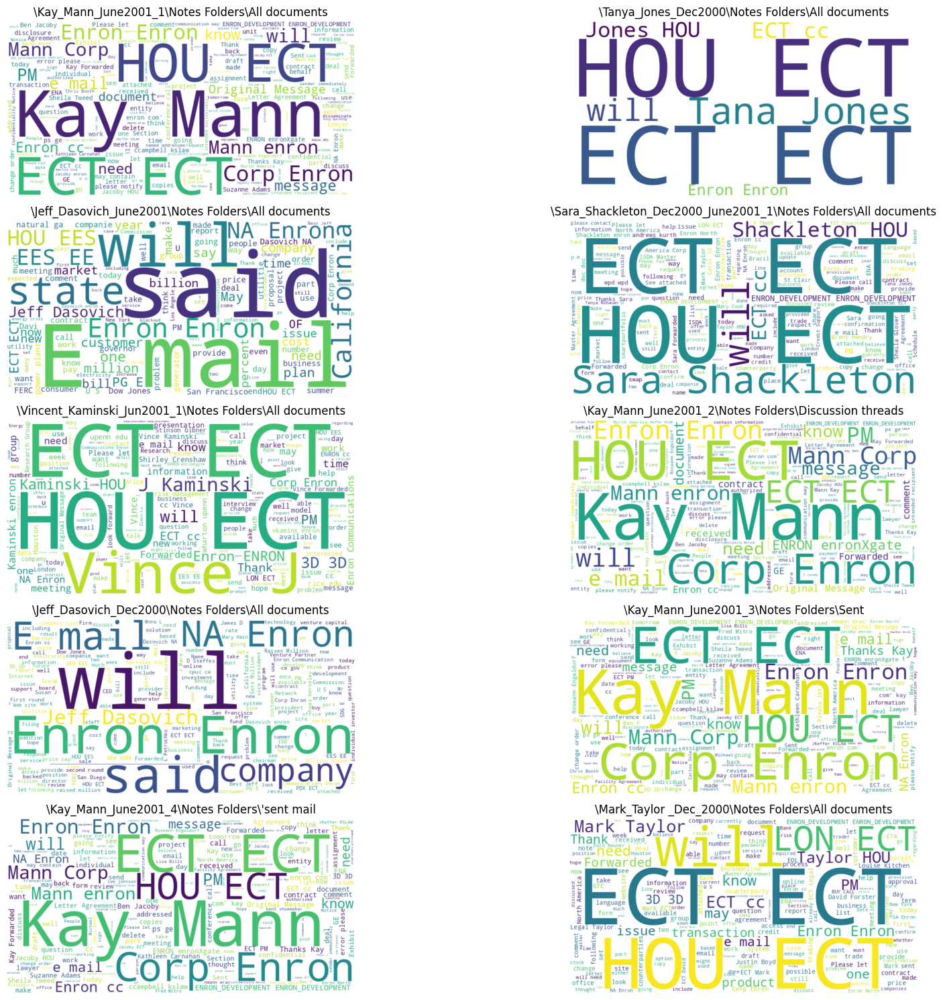

In [49]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pandas as pd

# Get top 10 folders
top_folders = df['folder'].value_counts().head(10).index
from wordcloud import STOPWORDS

custom_stopwords = set(STOPWORDS)

# Add common email junk words
custom_stopwords.update([
    "subject", "re", "fw", "http", "https", 
    "com", "www", "mailto"
])


plt.figure(figsize=(20, 15))

for i, folder in enumerate(top_folders, 1):
    
    # Combine all email text in this folder
    text = " ".join(df[df['folder'] == folder]['body'].dropna().astype(str))
    
    # Generate word cloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        stopwords=custom_stopwords  # you can add stopwords here
    ).generate(text)
    
    # Plot
    plt.subplot(5, 2, i)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(folder)
    plt.axis('off')

plt.tight_layout()
plt.show()


## Build Word clouds for most popular folders based on subject

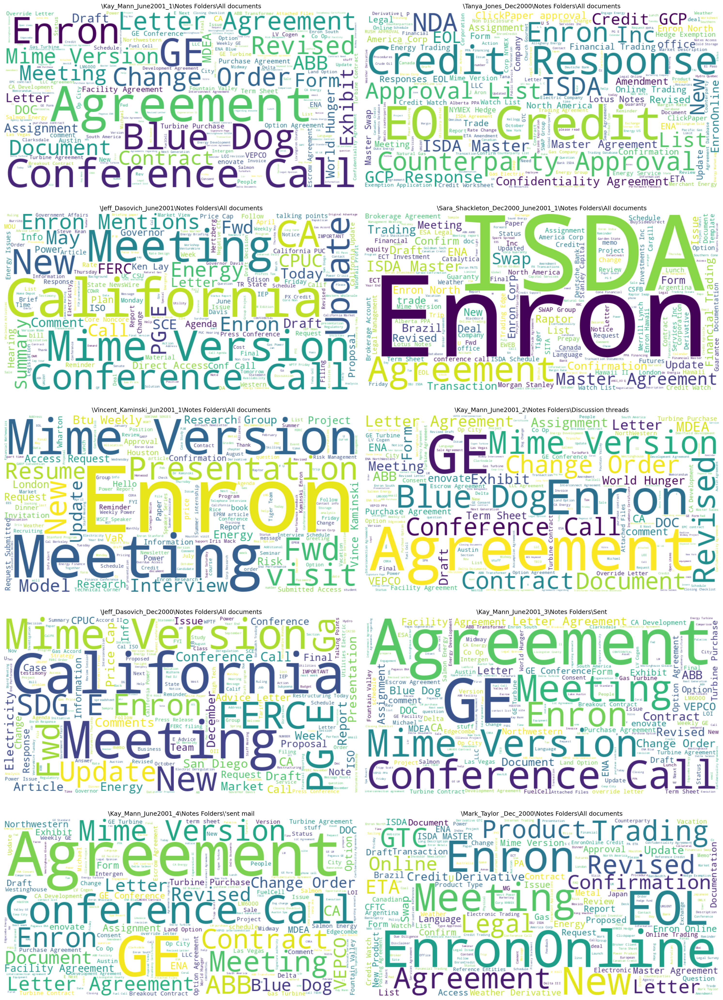

In [48]:
    import matplotlib.pyplot as plt
    from wordcloud import WordCloud
    import pandas as pd

    # Get top 10 folders
    top_folders = df['folder'].value_counts().head(10).index
    from wordcloud import STOPWORDS

    custom_stopwords = set(STOPWORDS)

    # Add common email junk words
    custom_stopwords.update([
        "subject", "re", "fw", "http", "https", 
        "com", "www", "mailto"
    ])



    fig, axes = plt.subplots(5, 2, figsize=(20, 28), dpi=150)


    for i, folder in enumerate(top_folders, 1):
        
        # Combine all email text in this folder
        text = " ".join(df[df['folder'] == folder]['subject'].dropna().astype(str))
        
        # Generate word cloud
        wordcloud = WordCloud(
            width=800,
            height=400,
            background_color='white',
            stopwords=custom_stopwords  # you can add stopwords here
        ).generate(text)
        
        # Plot
        # plt.subplot(10, 2, i)
        plt.subplot(5, 2, i)

        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(folder)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


## Build correlation Matrix with numerical terms

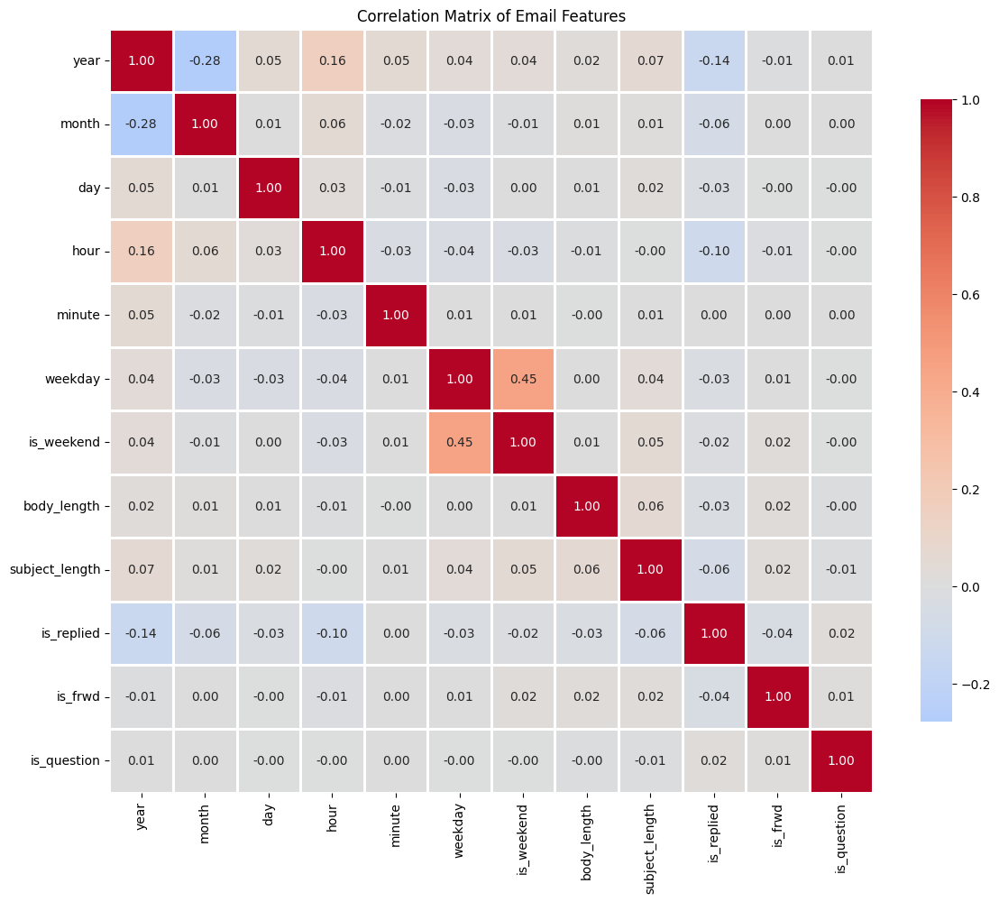

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select numerical columns for correlation matrix
numerical_cols = ['year', 'month', 'day', 'hour', 'minute', 'weekday', 
                  'is_weekend', 'body_length', 'subject_length', 
                  'is_replied', 'is_frwd', 'is_question']

# Create correlation matrix
correlation_matrix = df[numerical_cols].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix of Email Features')
plt.tight_layout()
plt.show()

In [1]:
import pandas as pd
df=pd.read_csv('data/emails.csv')

In [3]:
# sample 100K records for finding feature importance
df=df.sample(n=100000, random_state=42)

## Build a classifier and look at the feature importance

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Feature columns
cols = [
    'year', 'month', 'day', 'hour', 'minute', 'weekday',
    'is_weekend', 'body_length', 'subject_length',
    'is_replied', 'is_frwd', 'is_question'
]

X = df[cols]
y = df['folder']


In [5]:
class_counts = y.value_counts()
valid_classes = class_counts[class_counts >= 2].index

X_filtered = X[y.isin(valid_classes)]
y_filtered = y[y.isin(valid_classes)]

X_train, X_test, y_train, y_test = train_test_split(
    X_filtered, y_filtered,
    test_size=0.2,
    random_state=42,
    stratify=y_filtered   # important for multi-class balance
)


In [6]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(max_iter=1000))
])

pipeline.fit(X_train, y_train)


,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('scaler', ...), ('clf', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work

In [8]:
y_pred = pipeline.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))


Accuracy: 0.04184121536365013


In [9]:
import pandas as pd
import numpy as np

model = pipeline.named_steps['clf']

importance = pd.DataFrame(
    np.abs(model.coef_).mean(axis=0),
    index=cols,
    columns=['importance']
).sort_values(by='importance', ascending=False)

print(importance)


                importance
year              1.479382
month             1.082023
body_length       0.479995
subject_length    0.414487
is_replied        0.410114
hour              0.392854
day               0.392018
weekday           0.319207
minute            0.289259
is_weekend        0.229546
is_question       0.105065
is_frwd           0.065967
